In [1]:
from samap.mapping import SAMAP
from samap.analysis import (get_mapping_scores, GenePairFinder, transfer_annotations,
                            sankey_plot, chord_plot, CellTypeTriangles, 
                            ParalogSubstitutions, FunctionalEnrichment,
                            convert_eggnog_to_homologs, GeneTriangles)
from samalg import SAM
import pandas as pd

In this tutorial notebook, I will use SAMap to map planarian, schistosome, and hydra datasets together.

# Running BLAST

SAMap requires BLAST results between all pairs of species.

In this case, we need planarian to schistosome, planarian to hydra, and hydra to schistosome BLAST results. The below snippet demonstrates how to run BLAST for planarian/schistosome.

The below snippet uses a custom bash script `map_genes.sh` to run BLAST and auto-generates a directory called `maps/` in which the results will be deposited. Because BLAST is the most time-intensive step, I provide the precomputed BLAST output results in `example_data/maps/`.

The output BLAST tables for mapping planarian (`pl`) to schistosome (`sc`) are stored in `example_data/maps/plsc`. The two-character species IDs are specified below (`id1/id2`) and will be used as the species identifiers for the entire SAMap pipeline.

Below are what the BLAST output tables look like. There will be two tables: `pl_to_sc.txt` and `sc_to_pl.txt` which altogether describe the BLAST mappings in both directions. 

(`dd_Smed_v4...` are planarian transcript IDs and `Smp_...` are schistosome transcript IDs).

Reciprocal BLAST hits will be used to construct the gene homology graph used by SAMap.

Column `10` displays the E-values (SAMap uses an e-value threshold of `1e-6`). Column `11` displays the bit (sequence similarity) scores. The bit scores are used as the initial edge weights in the homology graph.

In [2]:
A=pd.read_csv('example_data/maps/plsc/pl_to_sc.txt',sep='\t',index_col=0,header=None)
B=pd.read_csv('example_data/maps/plsc/sc_to_pl.txt',sep='\t',index_col=0,header=None)
A.head()

,1,2,3,4,5,6,7,8,9,10,11
0,,,,,,,,,,,
dd_Smed_v4_10001_0_1,Smp_042920,30.594,219,144,4,167,814,13,226,4.210000e-30,112.0
dd_Smed_v4_10002_0_1,Smp_131400,30.709,127,79,4,190,555,328,450,3.400000e-11,62.4
dd_Smed_v4_10003_0_1,Smp_327560,41.079,241,126,5,112,798,22,258,1.610000e-43,162.0
dd_Smed_v4_10003_0_1,Smp_172110,36.567,134,72,5,109,474,147,279,1.080000e-17,84.3
dd_Smed_v4_10003_0_1,Smp_056760,30.075,133,90,2,163,555,44,175,1.140000e-13,72.4


In [3]:
B.head()

,1,2,3,4,5,6,7,8,9,10,11
0,,,,,,,,,,,
Smp_000040,dd_Smed_v4_8806_0_1,59.426,488,187,6,17,502,45,1481,1.030000e-163,478.0
Smp_000040,dd_Smed_v4_8136_0_1,51.883,478,213,5,20,497,25,1407,1.780000e-134,417.0
Smp_000040,dd_Smed_v4_6575_0_1,53.396,427,187,4,74,493,238,1503,6.790000e-114,353.0
Smp_000040,dd_Smed_v4_6449_0_1,49.727,366,161,5,91,435,239,1330,9.440000e-90,292.0
Smp_000040,dd_Smed_v4_6239_0_1,37.403,516,280,8,19,495,80,1615,1.120000e-84,276.0


# Running SAMap

SAMap accepts file paths to unprocessed, raw `.h5ad` files. The only processing that should be done on these files is to remove low-quality cells. Otherwise, they should be completely unprocessed.  

Alternatively, if you already have processed and run `SAM` objects, you can load them into SAMap directly. Below, we will show examples of both.

## Loading in raw data

When loading in raw data, SAMap will automatically process them with SAM and save the results to an `*_pr.h5ad` file. For example, f the raw data is `file.h5ad` the processed data will be saved to `file_pr.h5ad`.

In [4]:
fn1 = 'example_data/planarian.h5ad'
fn2 = 'example_data/schistosome.h5ad'
fn3 = 'example_data/hydra.h5ad'

SAMap expects the above to be in a dictionary keyed by the species IDs determined in the BLAST step:

In [5]:
filenames = {'pl':fn1,'sc':fn2,'hy':fn3}

Instantiate the SAMAP object as below. 

(Note that for the sake of this tutorial, the datasets have already been processed with SAM so we will load in the SAM objects directly.)

## Loading in SAM objects directly

In [6]:
sam1=SAM()
sam1.load_data(fn1)

sam2=SAM()
sam2.load_data(fn2)

sam3=SAM()
sam3.load_data(fn3)

In [7]:
sams = {'pl':sam1,'sc':sam2,'hy':sam3}

sm = SAMAP(
        sams,
        f_maps = 'example_data/maps/',
    )

Not updating the manifold...
Not updating the manifold...
Not updating the manifold...
14355 `pl` gene symbols match between the datasets and the BLAST graph.
7605 `sc` gene symbols match between the datasets and the BLAST graph.
12637 `hy` gene symbols match between the datasets and the BLAST graph.


We can now run the SAMap algorithm using the `run` function. This function returns a `SAM` object with all species stitched together.

In [8]:
samap = sm.run()

Prepping datasets for translation.
Translating feature spaces.
Projecting data into joint latent space. 3.236239194869995
Correcting data with means. 4.104567050933838
Expanding neighbourhoods of species pl...
Expanding neighbourhoods of species sc...
Expanding neighbourhoods of species hy...
Indegree coarsening
0/1 (0, 3124)
Rescaling edge weights by expression correlations.
Concatenating SAM objects...
ITERATION: 0 
Average alignment score (A.S.):  0.6218405539618266 
Max A.S. improvement: 0.9376306556331038 
Min A.S. improvement: 0.0
Calculating gene-gene correlations in the homology graph...
Prepping datasets for translation.
Translating feature spaces.
Projecting data into joint latent space. 1.7857871055603027
Correcting data with means. 2.640604019165039
Expanding neighbourhoods of species pl...
Expanding neighbourhoods of species sc...
Expanding neighbourhoods of species hy...
Indegree coarsening
0/1 (0, 3124)
Rescaling edge weights by expression correlations.
Concatenating SAM

### Digression: How does SAMap robustly determine cross-species neighbors?

SAMap initially identifies the k-nearest cross-species neighbors for each cell. It then looks at the mutual connectivity between neighborhoods of cells rather than individual cells to determine the connectivity of cells across species (see panel **D** below):

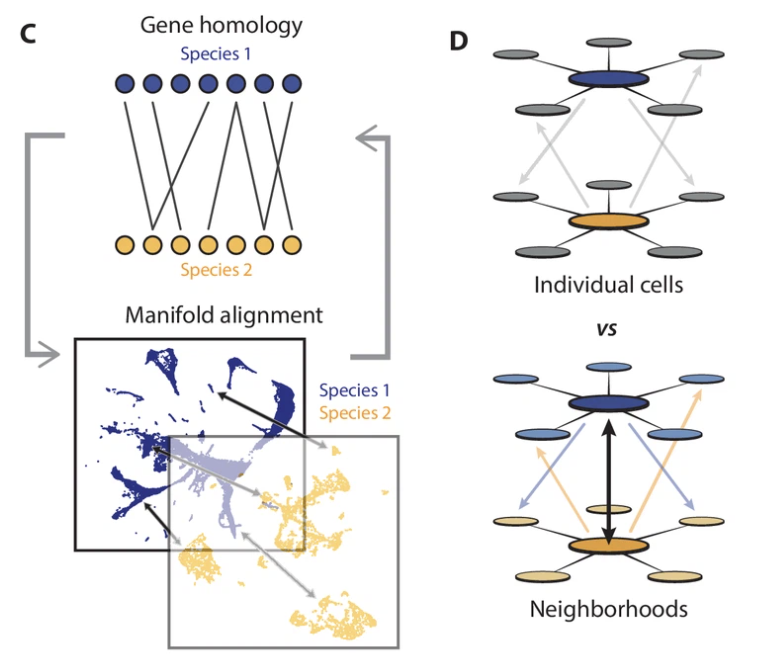

In this way, even if two cells are NOT directly connected to each other in the initial kNN graph, if their ***neighborhoods*** are connected, then these two cells will be considered as neighboring regardless. The exact edge weight is calculated by looking at the fraction of edges connecting their two neighborhoods.

By default, SAMap identifies neighborhoods within species by hopping along the outgoing edges from each cell in each species' manifold (constructed by SAM). To ensure that the neighborhoods do not get unreasonably large, this "hopping" is truncated by the size of the cluster to which each cell belongs. In other words, each cell's neighborhood will never be bigger than the size of its cluster. In this way, we mitigate scenarios where the neighborhoods of distinct cell types are erroneously merged together.

The clusters are computed using leiden clustering, and the resolution parameter is set to 3 by default. The resolution parameter can be specified using the `resolutions` argument in `SAMAP` as follows:

User-specified cell type annotations can be used in place of leiden clustering by specifying the `keys` parameter in `SAMAP`. For example, let's use 'cluster' in planarian, 'Cluster' in hydra, and 'tissue' in schistosome:

In [9]:
sm.sams['pl'].adata.obs['cluster'].head()

index
Cells_Trunk_TGAGCAGGTATT    Intestine: 6
Cells_Trunk_CTCGAACCAAAG    Intestine: 6
Cells_Trunk_ATCTAGTCGACN     Neoblast: 0
Cells_Trunk_CTTTGAAAATCT    Epidermal: 2
Cells_Trunk_CCTTTTAGAACT     Neoblast: 0
Name: cluster, dtype: category
Categories (42, object): ['Cathepsin+ cells: 4', 'Cathepsin+ cells: 10', 'Cathepsin+ cells: 15', 'Cathepsin+ cells: 17', ..., 'Pharynx: 37', 'Protonephridia: 26', 'Protonephridia: 29', 'Protonephridia: 40']

In [10]:
sm.sams['hy'].adata.obs['Cluster'].head()

index
03-MA_GCTAAAGCCACN    i_mgl
03-MA_CCCTATCCTGGG    i_mgl
03-MA_TGCAGTCCTGCC    i_mgl
03-MA_GCCCTGAAACCA    i_mgl
03-FM_AGGTTGGTCTTA    i_mgl
Name: Cluster, dtype: category
Categories (42, object): ['ecEp_SC2', 'ecEp_SC3', 'ecEp_bat1(mp)', 'ecEp_bat2(mp)', ..., 'i_smgc2', 'i_zmg1', 'i_zmg2', 'nan']

In [11]:
sm.sams['sc'].adata.obs['tissue'].head()

index
YX_1009901001_B20       Muscle
YX_1009901001_B4     Cathepsin
YX_1009901001_C23     Neoblast
YX_1009901001_C8        Neural
YX_1009901001_D2        Muscle
Name: tissue, dtype: category
Categories (11, object): ['Cathepsin', 'Flame cells', 'Gland', 'Intestine', ..., 'Neural_KK7', 'Parenchymal', 'Tegument', 'Tegument_prog']

Finally, rather than determining neighborhood sizes by hopping along each cell's outgoing edges, we can also determine them using the cell type labels. In other words, cells that have the same label all belong to the same neighborhood. This can be set using the `neigh_from_keys` parameter of `SAMAP.run`.

In [12]:
samap.adata

AnnData object with n_obs × n_vars = 3124 × 69475
    obs: 'Cluster', 'cluster', 'cluster_t', 'cluster_uncertainty', 'leiden_clusters', 'subcluster', 'tissue', 'tissue_smedwi', 'batch', 'species'
    uns: 'neighbors', 'gnnm_corr', 'umap', 'homology_graph_reweighted', 'homology_graph', 'homology_gene_names', 'homology_gene_names_dict'
    obsm: 'wPCA', 'X_umap'
    layers: 'X_disp'
    obsp: 'connectivities', 'xsim', 'knn'

# Post-SAMap analysis

Okay, so we were able to produce a SAM object, `samap`, with all three species stitched together.

Some notes about the combined SAM object:
- The expression data in `samap.adata` is a block-diagonal matrix of each species' gene expressions.
- The species ID for each cell is stored in `samap.adata.obs['species']`
- The combined graph is stored in `samap.adata.obs['connectivities']`
- The refined homology graph is stored in `samap.adata.uns['homology_graph_reweighted']` and the gene names corresponding to this graph are stored in `samap.adata.uns['homology_gene_names']`

Now, I'll go over some tools I provide to help interpret and visualize your results.


## Calculating mapping scores

To calculate alignment scores between cell types, we can use `get_mapping_scores`. This function will use the combined SAM object produced by SAMap to calculate alignment scores between cell types in the provided cell type annotation columns of `sam.adata.obs`. If no cell type annotations exist, the leiden clusters generated by SAM can be used (`'leiden_clusters'`).

The resulting tables show the highest-scoring alignment scores for each cell type (`D`) and pairwise mapping scores between cell types (`MappingTable`).

In [13]:
keys = {'pl':'cluster','hy':'Cluster','sc':'tissue'}
D,MappingTable = get_mapping_scores(sm,keys,n_top = 0)

In [14]:
D.head()

sc_Muscle                     pl_Muscle: 14                  \
         Cluster Alignment score           Cluster Alignment score   
0  pl_Muscle: 14         0.98414         sc_Muscle         0.98414   
1  pl_Muscle: 13        0.976835  hy_enEp_tent(pd)        0.225812   
2  pl_Muscle: 16        0.848059      hy_enEp_tent        0.178095   
3   pl_Muscle: 7        0.697078      sc_Intestine        0.049407   
4   hy_enEp_tent        0.668327     sc_Neural_KK7        0.031344   

      pl_Muscle: 13                      sc_Neoblast                  \
            Cluster Alignment score          Cluster Alignment score   
0         sc_Muscle        0.976835   pl_Neoblast: 0        0.973601   
1  hy_enEp_tent(pd)        0.080415  pl_Neoblast: 22        0.972496   
2      hy_enEp_tent        0.052719   pl_Neoblast: 5        0.627171   
3      sc_Intestine        0.036733         hy_i_nb1        0.557342   
4     sc_Neural_KK7        0.020728         hy_i_nb2        0.405958   

     pl_Neoblast: 0                  ...        hy_i_gmgc                  \
            Cluster Alignment score  ...          Cluster Alignment score   
0       sc_Neoblast        0.973601  ...  pl_Epidermal: 3        0.087711   
1        hy_i_fmgl1        0.515478  ...   sc_Parenchymal        0.079471   
2           hy_i_SC        0.487538  ...     pl_Neural: 1        0.060715   
3  hy_i_fmgl2_nurse        0.362765  ...        sc_Muscle        0.047783   
4          hy_i_mgl        0.317437  ...    pl_Neural: 32        0.038994   

          hy_enEp_nem2(pd)                 pl_Protonephridia: 29  \
                   Cluster Alignment score               Cluster   
0  pl_Cathepsin+ cells: 10        0.084618             sc_Neural   
1  pl_Cathepsin+ cells: 17        0.064467      hy_ecEp_bat2(mp)   
2             sc_Cathepsin        0.055375      hy_ecEp_bat1(mp)   
3                sc_Muscle        0.045661        sc_Flame cells   
4             sc_Intestine        0.034411          sc_Cathepsin   

                                sc_Gland                   sc_Neural_KK7  \
  Alignment score                Cluster Alignment score         Cluster   
0        0.073464  pl_Parapharyngeal: 12        0.061757  pl_Neoblast: 0   
1        0.056825       pl_Epidermal: 11        0.048028    pl_Neural: 1   
2        0.034092        pl_Epidermal: 3        0.032017   pl_Muscle: 14   
3        0.023854           pl_Neural: 1        0.026511   pl_Muscle: 13   
4        0.003082           pl_Neural: 8        0.022164    pl_Neural: 8   

                   
  Alignment score  
0         0.03232  
1        0.031613  
2        0.031344  
3        0.020728  
4        0.018566  

[5 rows x 190 columns]

In [15]:
MappingTable.head()

,pl_Cathepsin+ cells: 10,pl_Cathepsin+ cells: 15,pl_Cathepsin+ cells: 17,pl_Cathepsin+ cells: 28,pl_Cathepsin+ cells: 31,pl_Cathepsin+ cells: 39,pl_Cathepsin+ cells: 4,pl_Cathepsin+ cells: 41,pl_Epidermal: 11,pl_Epidermal: 2,...,hy_i_nc7,hy_i_nc8,hy_i_nc_gc_prog,hy_i_nc_prog,hy_i_nem,hy_i_smgc1,hy_i_smgc2,hy_i_zmg1,hy_i_zmg2,hy_nan
pl_Cathepsin+ cells: 10,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.010889,0.006410,0.0,0.0,0.146063
pl_Cathepsin+ cells: 15,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.001837,0.000000,0.0,0.0,0.029155
pl_Cathepsin+ cells: 17,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.007824,0.000000,0.0,0.0,0.095428
pl_Cathepsin+ cells: 28,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.003102,0.000970,0.0,0.0,0.041784
pl_Cathepsin+ cells: 31,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.004896,0.0,0.0,0.000000


The `n_top` parameter can be used to identify strongly-mapping subpopulations between clusters. If `n_top=0`, the alignment score will be averaged over all cells between two clusters. Otherwise, the alignment score will be averaged over the top `n_top` cells.

For example, let's say there are 100 / 1000 cells in Cluster A that maps to a Cluster B in the other species. On average, the mapping score between cluster A and B will be small, because there are only a few cells in cluster A that map to cluster B. If we set `n_top` to 100, then the alignment score between A and B will be averaged over the 100 highest-scoring cells. As a result, the mapping score between A and B will be large.

By default, `n_top=0`.

## Visualizing mapping scores

We can display a sankey plot to visualize mapping scores. Since the sankey plot is inherently a 2D visualization tool, we can only use it to visualize a linear set of connections. For example, in the first diagram below, the connections between planarian and hydra cell types are not shown.

- The linear species ordering can be specified by using `species_order`.
- `align_thr=0.05` zeros out mappings with alignment scores less than 0.05

In [16]:
sankey_plot(MappingTable, align_thr=0.05, species_order = ['pl','sc','hy'])

:Sankey   [source,target]   (Value)

In [17]:
sankey_plot(MappingTable, align_thr=0.05, species_order = ['sc','pl','hy'])

:Sankey   [source,target]   (Value)

We can visualize the connections between all pairs of species by using a chord plot (although it's not as interactive):

In [18]:
chord_plot(MappingTable, align_thr=0.05)

:Chord   [source,target]   (value,edge_grp)

Note that planarians and schistosomes are much more similar to each other than they are to hydra (which is expected, of course). As a result, mapping scores to hydra will tend to be smaller.

## Visualizing the combined projection

We can visualize the combined projection with `SAMAP.scatter`:

<AxesSubplot:>

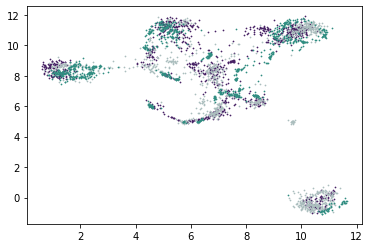

In [19]:
sm.scatter()

As the above is not interactive, it may be hard to see the overlap between species. For this, we can simply launch a SAMGUI instance from the combined SAM object (requires SAMGUI, see the README instructions in the [SAM](https://github.com/atarashansky/self-assembling-manifold) github repo):

In [20]:
sm.samap.gui()

    'data': [{'hoverinfo': 'text',
              'marker': {'size'…

To separate the species into different tabs so that each can be independently analyzed, we can use `SAMAP.gui` instead:

In [21]:
sm.gui()

    'data': [{'hoverinfo': 'text',
              'marker': {'size'…

## Finding gene pairs that are enriched in pairs of cell types

SAMap provides a class to find gene pairs enriched in different cell type pairs. The method entails finding gene pairs that contribute positively to the cross-species correlation between cell types and are differentially expressed in their respective mapped cell types.

In [22]:
gpf = GenePairFinder(sm,keys=keys)

... storing 'cluster' as categorical


Finding cluster-specific markers in pl:cluster.


... storing 'tissue' as categorical


Finding cluster-specific markers in sc:tissue.


... storing 'Cluster' as categorical


Finding cluster-specific markers in hy:Cluster.


`gpf.find_genes` can now be used to find gene pairs enriched in a cell type mapping.

***IMPORTANT*** The cell types MUST be prepended with the species IDs! So, for example `Neoblast` in schistosome should be written as `sc_Neoblast`.

`Gp` is an array of enriched gene pairs and `G1`, `G2` are the same genes separated from species 1/2

In [23]:
n1 = 'pl_Neoblast: 0' #cell type ID from organism 1 (must be present in `sam1.adata.obs[k1]`)
n2 = 'sc_Neoblast' #cell type ID from organism 2 (must be present in `sam2.adata.obs[k1]`)
Gp,G1,G2 = gpf.find_genes(n1,n2)
#Gp are the gene pairs, G1 are the genes from organism 1, G2 are the genes from organism 2

In [24]:
Gp[:5],G1[:5],G2[:5]

(array(['pl_dd_Smed_v4_659_0_1;sc_Smp_179320',
        'pl_dd_Smed_v4_2614_0_1;sc_Smp_086860',
        'pl_dd_Smed_v4_648_0_1;sc_Smp_027920',
        'pl_dd_Smed_v4_2787_0_1;sc_Smp_086860',
        'pl_dd_Smed_v4_7837_0_1;sc_Smp_082490'], dtype='<U37'),
 array(['pl_dd_Smed_v4_659_0_1', 'pl_dd_Smed_v4_2614_0_1',
        'pl_dd_Smed_v4_648_0_1', 'pl_dd_Smed_v4_2787_0_1',
        'pl_dd_Smed_v4_7837_0_1'], dtype='<U23'),
 array(['sc_Smp_179320', 'sc_Smp_086860', 'sc_Smp_027920', 'sc_Smp_082490',
        'sc_Smp_162370'], dtype='<U13'))

To get a table of enriched gene pairs from all cell type mappings that have an alignment score above some threshold (`align_thr`), you can use:

In [25]:
gene_pairs = gpf.find_all(align_thr=0.05)

Calculating gene pairs for the mapping: hy;ecEp_SC2 to pl;Epidermal: 2
Calculating gene pairs for the mapping: hy;ecEp_SC2 to pl;Epidermal: 3
Calculating gene pairs for the mapping: hy;ecEp_SC2 to pl;Epidermal: 35
Calculating gene pairs for the mapping: hy;ecEp_SC2 to sc;Tegument_prog
Calculating gene pairs for the mapping: hy;ecEp_SC3 to pl;Epidermal: 11
Calculating gene pairs for the mapping: hy;ecEp_SC3 to pl;Epidermal: 2
Calculating gene pairs for the mapping: hy;ecEp_SC3 to pl;Epidermal: 35
Calculating gene pairs for the mapping: hy;ecEp_SC3 to sc;Tegument_prog
Calculating gene pairs for the mapping: hy;ecEp_bat1(mp) to pl;Pharynx: 25
Calculating gene pairs for the mapping: hy;ecEp_bat1(mp) to pl;Pharynx: 37
Calculating gene pairs for the mapping: hy;ecEp_bat1(mp) to pl;Protonephridia: 40
Calculating gene pairs for the mapping: hy;ecEp_bat1(mp) to sc;Tegument
Calculating gene pairs for the mapping: hy;ecEp_bat2(mp) to pl;Pharynx: 25
Calculating gene pairs for the mapping: hy;ecEp_

In [26]:
gene_pairs.head()

,hy_ecEp_SC2;pl_Epidermal: 2,hy_ecEp_SC2;pl_Epidermal: 3,hy_ecEp_SC2;pl_Epidermal: 35,hy_ecEp_SC2;sc_Tegument_prog,hy_ecEp_SC3;pl_Epidermal: 11,hy_ecEp_SC3;pl_Epidermal: 2,hy_ecEp_SC3;pl_Epidermal: 35,hy_ecEp_SC3;sc_Tegument_prog,hy_ecEp_bat1(mp);pl_Pharynx: 25,hy_ecEp_bat1(mp);pl_Pharynx: 37,...,pl_Parapharyngeal: 12;sc_Parenchymal,pl_Parapharyngeal: 38;sc_Cathepsin,pl_Parapharyngeal: 38;sc_Muscle,pl_Parapharyngeal: 38;sc_Neural,pl_Parapharyngeal: 38;sc_Parenchymal,pl_Pharynx: 25;sc_Neoblast,pl_Pharynx: 25;sc_Tegument_prog,pl_Pharynx: 27;sc_Flame cells,pl_Protonephridia: 26;sc_Parenchymal,pl_Protonephridia: 29;sc_Neural
0,hy_t14973aep;pl_dd_Smed_v4_361_0_1,hy_t14973aep;pl_dd_Smed_v4_361_0_1,hy_t13309aep;pl_dd_Smed_v4_361_0_1,hy_t3449aep;sc_Smp_335630,hy_t14973aep;pl_dd_Smed_v4_361_0_1,hy_t14973aep;pl_dd_Smed_v4_361_0_1,hy_t14973aep;pl_dd_Smed_v4_361_0_1,hy_t3449aep;sc_Smp_335630,hy_t34824aep;pl_dd_Smed_v4_1291_0_1,hy_t34824aep;pl_dd_Smed_v4_1291_0_1,...,pl_dd_Smed_v4_246_0_1;sc_Smp_306600,pl_dd_Smed_v4_2966_0_1;sc_Smp_082810,pl_dd_Smed_v4_4267_0_1;sc_Smp_147430,pl_dd_Smed_v4_38_0_1;sc_Smp_078040,NaN,pl_dd_Smed_v4_8673_0_1;sc_Smp_136640,pl_dd_Smed_v4_766_0_1;sc_Smp_003610,pl_dd_Smed_v4_1404_0_1;sc_Smp_147890,pl_dd_Smed_v4_516_0_1;sc_Smp_089430,NaN
1,hy_t13309aep;pl_dd_Smed_v4_361_0_1,hy_t13309aep;pl_dd_Smed_v4_361_0_1,hy_t14973aep;pl_dd_Smed_v4_361_0_1,hy_t31713aep;sc_Smp_016780,hy_t13309aep;pl_dd_Smed_v4_361_0_1,hy_t13309aep;pl_dd_Smed_v4_361_0_1,hy_t13309aep;pl_dd_Smed_v4_361_0_1,hy_t31713aep;sc_Smp_016780,hy_t10876aep;pl_dd_Smed_v4_1673_0_1,hy_t27258aep;pl_dd_Smed_v4_2514_0_1,...,pl_dd_Smed_v4_246_0_1;sc_Smp_183710,pl_dd_Smed_v4_2966_0_1;sc_Smp_210430,pl_dd_Smed_v4_4267_0_1;sc_Smp_153780,pl_dd_Smed_v4_83_0_1;sc_Smp_078040,NaN,pl_dd_Smed_v4_8673_0_1;sc_Smp_067490,pl_dd_Smed_v4_8673_0_1;sc_Smp_136640,pl_dd_Smed_v4_3116_0_1;sc_Smp_152990,pl_dd_Smed_v4_285_0_1;sc_Smp_306600,NaN
2,hy_t10876aep;pl_dd_Smed_v4_1215_0_1,hy_t38670aep;pl_dd_Smed_v4_1131_0_1,hy_t38670aep;pl_dd_Smed_v4_1131_0_1,hy_t12736aep;sc_Smp_335630,hy_t24448aep;pl_dd_Smed_v4_43159_0_1,hy_t10876aep;pl_dd_Smed_v4_1215_0_1,hy_t38670aep;pl_dd_Smed_v4_1131_0_1,hy_t12736aep;sc_Smp_335630,hy_t27258aep;pl_dd_Smed_v4_2514_0_1,hy_t9989aep;pl_dd_Smed_v4_522_0_1,...,pl_dd_Smed_v4_209_0_1;sc_Smp_097750,NaN,NaN,NaN,NaN,pl_dd_Smed_v4_1131_0_1;sc_Smp_066760,pl_dd_Smed_v4_8673_0_1;sc_Smp_067490,pl_dd_Smed_v4_3482_0_1;sc_Smp_078230,pl_dd_Smed_v4_246_0_1;sc_Smp_306600,NaN
3,hy_t38670aep;pl_dd_Smed_v4_1131_0_1,hy_t10876aep;pl_dd_Smed_v4_929_0_1,hy_t10821aep;pl_dd_Smed_v4_896_0_1,hy_t21278aep;sc_Smp_336630,hy_t19278aep;pl_dd_Smed_v4_1971_0_1,hy_t38670aep;pl_dd_Smed_v4_1131_0_1,hy_t16778aep;pl_dd_Smed_v4_4456_0_1,hy_t12862aep;sc_Smp_132740,hy_t36308aep;pl_dd_Smed_v4_1414_0_1,hy_t10876aep;pl_dd_Smed_v4_1673_0_1,...,pl_dd_Smed_v4_285_0_1;sc_Smp_306600,NaN,NaN,NaN,NaN,pl_dd_Smed_v4_246_0_1;sc_Smp_063040,pl_dd_Smed_v4_177_0_1;sc_Smp_320400,pl_dd_Smed_v4_2745_0_1;sc_Smp_344500,pl_dd_Smed_v4_285_0_1;sc_Smp_183710,NaN
4,hy_t19278aep;pl_dd_Smed_v4_1971_0_1,hy_t10388aep;pl_dd_Smed_v4_2946_0_1,hy_t31824aep;pl_dd_Smed_v4_4456_0_1,hy_t10388aep;sc_Smp_049580,hy_t10876aep;pl_dd_Smed_v4_1215_0_1,hy_t19278aep;pl_dd_Smed_v4_1971_0_1,hy_t10821aep;pl_dd_Smed_v4_896_0_1,hy_t10388aep;sc_Smp_049580,hy_t18275aep;pl_dd_Smed_v4_8673_0_1,hy_t18275aep;pl_dd_Smed_v4_1971_0_1,...,pl_dd_Smed_v4_285_0_1;sc_Smp_183710,NaN,NaN,NaN,NaN,pl_dd_Smed_v4_285_0_1;sc_Smp_063040,pl_dd_Smed_v4_613_0_1;sc_Smp_312630,pl_dd_Smed_v4_3482_0_1;sc_Smp_141230,pl_dd_Smed_v4_246_0_1;sc_Smp_183710,NaN


To get a table of gene pairs enriched in all cell types conected to schistosome muscle cells, we can use:

In [27]:
gene_pairs = gpf.find_all(n='sc_Muscle', align_thr=0.05)

Calculating gene pairs for the mapping: hy;enEp_foot to sc;Muscle
Calculating gene pairs for the mapping: hy;enEp_nem1(pd) to sc;Muscle
Calculating gene pairs for the mapping: hy;enEp_tent to sc;Muscle
Calculating gene pairs for the mapping: hy;enEp_tent(pd) to sc;Muscle
Calculating gene pairs for the mapping: hy;i_zmg1 to sc;Muscle
Calculating gene pairs for the mapping: hy;i_zmg2 to sc;Muscle
Calculating gene pairs for the mapping: pl;Muscle: 13 to sc;Muscle
Calculating gene pairs for the mapping: pl;Muscle: 14 to sc;Muscle
Calculating gene pairs for the mapping: pl;Muscle: 16 to sc;Muscle
Calculating gene pairs for the mapping: pl;Muscle: 7 to sc;Muscle
Calculating gene pairs for the mapping: pl;Neural: 23 to sc;Muscle
Calculating gene pairs for the mapping: pl;Neural: 34 to sc;Muscle
Calculating gene pairs for the mapping: pl;Neural: 36 to sc;Muscle
Calculating gene pairs for the mapping: pl;Parapharyngeal: 38 to sc;Muscle


In [28]:
gene_pairs.head()

,hy_enEp_foot;sc_Muscle,hy_enEp_nem1(pd);sc_Muscle,hy_enEp_tent;sc_Muscle,hy_enEp_tent(pd);sc_Muscle,hy_i_zmg1;sc_Muscle,hy_i_zmg2;sc_Muscle,pl_Muscle: 13;sc_Muscle,pl_Muscle: 14;sc_Muscle,pl_Muscle: 16;sc_Muscle,pl_Muscle: 7;sc_Muscle,pl_Neural: 23;sc_Muscle,pl_Neural: 34;sc_Muscle,pl_Neural: 36;sc_Muscle,pl_Parapharyngeal: 38;sc_Muscle
0,hy_t13067aep;sc_Smp_047460,hy_t7296aep;sc_Smp_213910,hy_t30001aep;sc_Smp_164590,hy_t13067aep;sc_Smp_047460,NaN,NaN,pl_dd_Smed_v4_8356_0_1;sc_Smp_020550,pl_dd_Smed_v4_649_0_1;sc_Smp_164590,pl_dd_Smed_v4_9529_0_1;sc_Smp_136710,pl_dd_Smed_v4_2337_0_1;sc_Smp_170340,pl_dd_Smed_v4_10835_0_1;sc_Smp_344620,NaN,pl_dd_Smed_v4_1417_0_1;sc_Smp_147680,pl_dd_Smed_v4_4267_0_1;sc_Smp_147430
1,hy_t7296aep;sc_Smp_213910,hy_t296aep;sc_Smp_213910,hy_t30001aep;sc_Smp_213910,hy_t18238aep;sc_Smp_047460,NaN,NaN,pl_dd_Smed_v4_8356_0_1;sc_Smp_310170,pl_dd_Smed_v4_649_0_1;sc_Smp_170340,pl_dd_Smed_v4_2337_0_1;sc_Smp_170340,pl_dd_Smed_v4_2337_0_1;sc_Smp_135560,pl_dd_Smed_v4_10835_0_1;sc_Smp_306270,NaN,pl_dd_Smed_v4_2164_0_1;sc_Smp_344580,pl_dd_Smed_v4_4267_0_1;sc_Smp_153780
2,hy_t7296aep;sc_Smp_164590,hy_t7296aep;sc_Smp_135560,hy_t21554aep;sc_Smp_145140,hy_t24994aep;sc_Smp_047460,NaN,NaN,pl_dd_Smed_v4_7811_0_1;sc_Smp_164590,pl_dd_Smed_v4_649_0_1;sc_Smp_135560,pl_dd_Smed_v4_2337_0_1;sc_Smp_213910,pl_dd_Smed_v4_2337_0_1;sc_Smp_164590,pl_dd_Smed_v4_9475_0_1;sc_Smp_344620,NaN,NaN,NaN
3,hy_t25002aep;sc_Smp_126240,hy_t296aep;sc_Smp_135560,hy_t13067aep;sc_Smp_047460,hy_t14477aep;sc_Smp_213910,NaN,NaN,pl_dd_Smed_v4_7811_0_1;sc_Smp_170340,pl_dd_Smed_v4_649_0_1;sc_Smp_123830,pl_dd_Smed_v4_2337_0_1;sc_Smp_213900,pl_dd_Smed_v4_2337_0_1;sc_Smp_213910,pl_dd_Smed_v4_10835_0_1;sc_Smp_145700,NaN,NaN,NaN
4,hy_t7296aep;sc_Smp_135560,hy_t7296aep;sc_Smp_164590,hy_t30001aep;sc_Smp_123830,hy_t12725aep;sc_Smp_345440,NaN,NaN,pl_dd_Smed_v4_7811_0_1;sc_Smp_123830,pl_dd_Smed_v4_649_0_1;sc_Smp_196840,pl_dd_Smed_v4_323_0_1;sc_Smp_018250,pl_dd_Smed_v4_2337_0_1;sc_Smp_123830,pl_dd_Smed_v4_1721_0_1;sc_Smp_343120,NaN,NaN,NaN


## Plotting expression overlap

Let's plot the expression overlap between three genes taken from the above table: `dd_Smed_v4_9529_0_1`,`Smp_136710`, and `t13067aep`. These genes are enriched in the muscle cells across the three species.

Species-specific colors can be specified by hex codes using a dictionary keyed by the species IDs (e.g. `COLORS={'pl':'#000000',...}`). By default, colors are chosen randomly. By default, cells are colored cyan when they are overlapping in expression with the genes from other species (`COLORC='#00ceb5'`). The bottom layer show all cells colored in gray.

<AxesSubplot:>

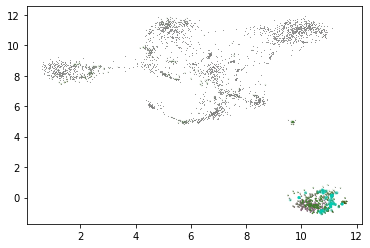

In [29]:
sm.plot_expression_overlap({'pl':'dd_Smed_v4_9529_0_1','sc':'Smp_136710','hy':'t13067aep'})

Or showing overlap of genes from only two species:

<AxesSubplot:>

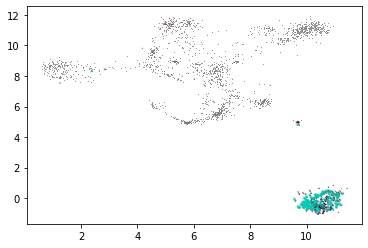

In [55]:
sm.plot_expression_overlap({'pl':'dd_Smed_v4_9529_0_1','sc':'Smp_136710'})

## Transferring annotations

We can transfer annotations from a reference species (`sc` below) to the cells in the other species by propagating labels across the combined manifold using a diffusion process.

In [30]:
table=transfer_annotations(sm,reference_id='sc',keys='tissue')

`table` contains the soft-membership scores for each cell in each schistosome tissue, along with the label with the maximum membership score.

In [31]:
table.head()

,sc_Cathepsin,sc_Flame cells,sc_Gland,sc_Intestine,sc_Muscle,sc_Neoblast,sc_Neural,sc_Neural_KK7,sc_Parenchymal,sc_Tegument,sc_Tegument_prog,labels
Cells_Trunk_TGAGCAGGTATT,0.012842,0.000026,0.000490,0.000827,0.000058,0.951029,0.000011,4.545749e-07,0.002212,0.000080,0.032425,sc_Neoblast
Cells_Trunk_CTCGAACCAAAG,0.005992,0.000020,0.000098,0.000327,0.000029,0.966022,0.000007,1.401348e-07,0.001087,0.000038,0.026380,sc_Neoblast
Cells_Trunk_ATCTAGTCGACN,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,sc_Neoblast
Cells_Trunk_CTTTGAAAATCT,0.000286,0.000000,0.000009,0.000004,0.000001,0.000075,0.000012,0.000000e+00,0.004021,0.001018,0.994574,sc_Tegument_prog
Cells_Trunk_CCTTTTAGAACT,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,sc_Neoblast


- The transferred labels are stored in `sm.samap.adata.obs['tissue_transfer']`.
- The uncertainty of the transferred labels are stored in `sm.samap.adata.obs['tissue_uncertainty']`.


<AxesSubplot:>

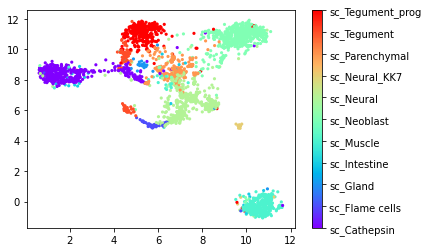

In [32]:
sm.samap.scatter(c='tissue_transfer')

<AxesSubplot:>

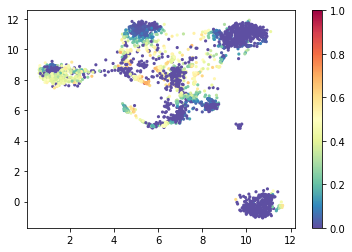

In [33]:
sm.samap.scatter(c='tissue_uncertainty',cmap='Spectral_r')

## Identifying cell type triangles

To identify robust cell type mappings, it might be useful to find all mappings that are involved in closed triangles (meaning the three cell types all mutually map to each other).

In [34]:
keys={'pl':'cluster','sc':'tissue','hy':'Cluster'}
result = CellTypeTriangles(sm,keys,align_thr=0.05)

In [35]:
result.head()

,pl,sc,hy
0,pl_Epidermal: 2,sc_Tegument_prog,hy_ecEp_SC2
1,pl_Epidermal: 3,sc_Tegument_prog,hy_ecEp_SC2
2,pl_Epidermal: 35,sc_Tegument_prog,hy_ecEp_SC2
3,pl_Epidermal: 2,sc_Tegument_prog,hy_ecEp_SC3
4,pl_Epidermal: 2,sc_Tegument_prog,hy_ecEp_nem1(pd)


## Identifying paralog substitution events

Paralog substitution events are cases in which paralogs across species have more similar expression patterns than orthologs.

SAMap provides tools to identify such events, but first we need to determine which gene paris are orthologs and which are paralogs. Here, we'll define paralogs as genes whose most recent common ancestor is the eukaryote and orthologs as genes whose most recent common ancestors are bilaterians.

This information can be obtained by using EGGNOG, which maps each transcript to a set of orthology groups in its database. I provide precomputed eggnog tables in `example_data/eggnog/`.

In [36]:
A=pd.read_csv('example_data/eggnog/planarian.tsv',sep='\t',index_col=0)
B=pd.read_csv('example_data/eggnog/schistosome.tsv',sep='\t',index_col=0)
C=pd.read_csv('example_data/eggnog/hydra.tsv',sep='\t',index_col=0)

In [37]:
A.head()

,1,2,3,4,5,6,7,8,9,10,...,12,13,14,15,16,17,eggNOG_OGs,19,KOG,21
dd_Smed_v4_10001_0_1,6412.HelroP88781,4.000000e-25,122.1,Bilateria,STK19,"GO:0003674,GO:0003824,GO:0004672,GO:0004674,GO...",2.7.11.1,ko:K08880,NaN,NaN,...,NaN,"ko00000,ko01000,ko01001",NaN,NaN,NaN,Metazoa,"296WV@1,2RDW5@2759,38QQK@33154,3BI2B@33208,3CT...",NA|NA|NA,S,kinase 19
dd_Smed_v4_10002_0_1,13735.ENSPSIP00000012485,5.000000e-22,111.7,Testudines,GNPTG,"GO:0000139,GO:0003674,GO:0005488,GO:0005515,GO...",NaN,ko:K10087,"ko04142,map04142",NaN,...,NaN,"ko00000,ko00001,ko04091",NaN,NaN,NaN,Metazoa,"38GXK@33154,3BHNW@33208,3CZKV@33213,47ZE5@7711...",NA|NA|NA,T,Glucosidase II beta subunit-like protein
dd_Smed_v4_10003_0_1,7739.XP_002612462.1,1.600000e-56,227.3,Chordata,TMX3,"GO:0002576,GO:0003674,GO:0003756,GO:0003824,GO...",5.3.4.1,ko:K09585,NaN,NaN,...,NaN,"ko00000,ko01000,ko03110,ko04131",NaN,NaN,NaN,Metazoa,"38GA9@33154,3BCH7@33208,3CYFW@33213,488KJ@7711...",NA|NA|NA,CO,thiol oxidase activity
dd_Smed_v4_100044_0_1,6211.A0A068Y6A6,8.000000e-21,105.9,Bilateria,NaN,NaN,NaN,ko:K10406,NaN,NaN,...,NaN,"ko00000,ko04812",NaN,NaN,NaN,Metazoa,"38D7J@33154,3BABC@33208,3CTH1@33213,COG5059@1,...",NA|NA|NA,Z,microtubule motor activity
dd_Smed_v4_10005_0_1,7245.FBpp0257390,2.300000e-13,82.8,Insecta,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,Arthropoda,"2BQ87@1,2S1TK@2759,3A5HK@33154,3BSDN@33208,3D8...",NA|NA|NA,NaN,NaN


The orthology group info is stored in column `eggNOG_OGs`:

In [38]:
A['eggNOG_OGs'].head()

dd_Smed_v4_10001_0_1     296WV@1,2RDW5@2759,38QQK@33154,3BI2B@33208,3CT...
dd_Smed_v4_10002_0_1     38GXK@33154,3BHNW@33208,3CZKV@33213,47ZE5@7711...
dd_Smed_v4_10003_0_1     38GA9@33154,3BCH7@33208,3CYFW@33213,488KJ@7711...
dd_Smed_v4_100044_0_1    38D7J@33154,3BABC@33208,3CTH1@33213,COG5059@1,...
dd_Smed_v4_10005_0_1     2BQ87@1,2S1TK@2759,3A5HK@33154,3BSDN@33208,3D8...
Name: eggNOG_OGs, dtype: object

In [39]:
EGGs={'pl':A,'sc':B,'hy':C}

In [40]:
ortholog_pairs = convert_eggnog_to_homologs(sm,EGGs,og_key='eggNOG_OGs',taxon=33213) #33213 is the taxon code for Bilaterians

In [41]:
paralog_pairs = convert_eggnog_to_homologs(sm,EGGs,og_key='eggNOG_OGs',taxon=2759) #2759 is the taxon code for Eukaryotes

In [42]:
ortholog_pairs[:5]

array([['hy_t10035aep', 'pl_dd_Smed_v4_13203_0_1'],
       ['hy_t10035aep', 'pl_dd_Smed_v4_255_0_1'],
       ['hy_t10035aep', 'pl_dd_Smed_v4_3441_0_1'],
       ['hy_t10035aep', 'pl_dd_Smed_v4_414_0_1'],
       ['hy_t10035aep', 'pl_dd_Smed_v4_5491_0_1']], dtype='<U24')

In [43]:
paralog_pairs[:5]

array([['hy_t10009aep', 'pl_dd_Smed_v4_13396_0_1'],
       ['hy_t10009aep', 'pl_dd_Smed_v4_13717_0_1'],
       ['hy_t10009aep', 'pl_dd_Smed_v4_14346_0_1'],
       ['hy_t10009aep', 'pl_dd_Smed_v4_14835_0_1'],
       ['hy_t10009aep', 'pl_dd_Smed_v4_14987_0_1']], dtype='<U24')

Note that there are very few hydra orthologs found overall since hydra's common ancestor with the flatworms is Metazoa not Bilateria. The fact that we find any hydra orthologs at all is due the fact that Eggnog only approximates orthology and does not do *de novo* phylogenetic reconstruction.

We can now find paralog substitutions like so (`psub_thr` determines the minimum amount the paralog correlation should exceed the ortholog correlation to be considered a paralog substitution):

In [44]:
Psubs = ParalogSubstitutions(sm,ortholog_pairs,paralog_pairs=paralog_pairs,psub_thr=0.3)

# Calculating gene triangles
Gene triangles are triangles of homologous genes with similar expression patterns. The connected genes may be orthologous, homologous, paralogous, or substitution events. These triangles provide a rich summary of the gene connectivity across species. For example, orthologous genes in planarian and schistosome may have high expression similarity but the correspondingly similar genes in hydra may be paralogs instead, indicating some evolutionay rearrangement.

Explanation of columns:
- `pl gene`: Planarian gene
- `sc gene`: Schistosome gene
- `hy gene`: Hydra gene
- `pl/sc subbed`: If applicable, the substituted ortholog(s) in the planarian/schistosome homolog pair.
- `pl/hy subbed`: If applicable, the substituted ortholog(s) in the planarian/hydra homolog pair.
- `sc/hy subbed`: If applicable, the substituted ortholog(s) in the schistosome/hydra homolog pair.
- `pl/sc`: The planarian/schistosome gene pair.
- `pl/hy`: The planarian/hydra gene pair.
- `sc/hy`: The schistosome/hydra gene pair.
- `pl/sc corr`: The correlation between the `pl/sc` genes.
- `pl/hy corr`: The correlation between the `pl/hy` genes.
- `sc/hy corr`: The correlation between the `sc/hy` genes.
- `pl/sc type`: Whether the gene pair is an ortholog, homolog, or a substitution event.
- `pl/hy type`: Same as above.
- `sc/hy type`: Same as above.
- `#orthologs`: The number of edges which are orthologs in the triangle (max 3).
- `#substitutions`: The number of edges which are substitution events in the triangle (max 3).
- `min_corr`: The minimum correlation in the triangle.
- `pl cell type`: The planarian cell types that the planarian gene is enriched in.
- `sc cell type`: The schistosome cell types that the schistosome gene is enriched in.
- `hy cell type`: The hydra cell types that the hydra gene is enriched in.

In [45]:
Gtris = GeneTriangles(sm,
                      ortholog_pairs,
                      keys=keys,
                      compute_markers=False) #we set compute_markers to False since they have already been computed in the previous enriched gene pairs step.

In [46]:
Gtris

,pl gene,sc gene,hy gene,pl/sc subbed,pl/hy subbed,sc/hy subbed,pl/sc,pl/hy,sc/hy,pl/sc corr,...,sc/hy corr,pl/sc type,pl/hy type,sc/hy type,#orthologs,#substitutions,min_corr,pl cell type,sc cell type,hy cell type
16939,pl_dd_Smed_v4_4453_0_1,sc_Smp_241990,hy_t17448aep,N.S.,N.S.,N.S.,pl_dd_Smed_v4_4453_0_1;sc_Smp_241990,pl_dd_Smed_v4_4453_0_1;hy_t17448aep,sc_Smp_241990;hy_t17448aep,0.678025,...,0.565634,ortholog,ortholog,ortholog,3,0,0.539210,Pharynx: 27,Flame cells,i_mgl
13139,pl_dd_Smed_v4_5880_0_1,sc_Smp_328690,hy_t15999aep,N.S.,hy_t8956aep,hy_t8956aep,pl_dd_Smed_v4_5880_0_1;sc_Smp_328690,pl_dd_Smed_v4_5880_0_1;hy_t15999aep,sc_Smp_328690;hy_t15999aep,0.607087,...,0.530898,ortholog,substitution,substitution,1,2,0.530898,Pharynx: 27,Flame cells,i_mgl
45941,pl_dd_Smed_v4_6338_0_1,sc_Smp_174090,hy_t31129aep,N.S.,N.S.,N.S.,pl_dd_Smed_v4_6338_0_1;sc_Smp_174090,pl_dd_Smed_v4_6338_0_1;hy_t31129aep,sc_Smp_174090;hy_t31129aep,0.670065,...,0.589497,ortholog,ortholog,ortholog,3,0,0.503230,Neural: 20,Flame cells,i_mgl
29395,pl_dd_Smed_v4_4547_0_1,sc_Smp_332520,hy_t22369aep,N.S.,hy_t22021aep,hy_t22021aep,pl_dd_Smed_v4_4547_0_1;sc_Smp_332520,pl_dd_Smed_v4_4547_0_1;hy_t22369aep,sc_Smp_332520;hy_t22369aep,0.694344,...,0.501508,ortholog,substitution,substitution,1,2,0.495424,Neural: 20,Flame cells,i_mgl
56074,pl_dd_Smed_v4_9353_0_1,sc_Smp_347070,hy_t36240aep,pl_dd_Smed_v4_43156_0_1;pl_dd_Smed_v4_85086_0_...,N.S.,hy_t5729aep;sc_Smp_157240;sc_Smp_163380,pl_dd_Smed_v4_9353_0_1;sc_Smp_347070,pl_dd_Smed_v4_9353_0_1;hy_t36240aep,sc_Smp_347070;hy_t36240aep,0.476892,...,0.587962,substitution,ortholog,substitution,1,2,0.467986,Pharynx: 37,Flame cells,i_mgl
56057,pl_dd_Smed_v4_9353_0_1,sc_Smp_141230,hy_t36240aep,pl_dd_Smed_v4_10045_0_1;pl_dd_Smed_v4_10966_0_...,N.S.,sc_Smp_157240;sc_Smp_163380,pl_dd_Smed_v4_9353_0_1;sc_Smp_141230,pl_dd_Smed_v4_9353_0_1;hy_t36240aep,sc_Smp_141230;hy_t36240aep,0.579073,...,0.72096,substitution,ortholog,substitution,1,2,0.467986,Pharynx: 37,Flame cells,i_mgl
56055,pl_dd_Smed_v4_9353_0_1,sc_Smp_134260,hy_t36240aep,sc_Smp_157240;sc_Smp_163380,N.S.,sc_Smp_157240;sc_Smp_163380,pl_dd_Smed_v4_9353_0_1;sc_Smp_134260,pl_dd_Smed_v4_9353_0_1;hy_t36240aep,sc_Smp_134260;hy_t36240aep,0.48588,...,0.590195,substitution,ortholog,substitution,1,2,0.467986,Pharynx: 37,Flame cells,i_mgl
9881,pl_dd_Smed_v4_5727_0_1,sc_Smp_156370,hy_t14947aep,N.S.,N.S.,N.S.,pl_dd_Smed_v4_5727_0_1;sc_Smp_156370,pl_dd_Smed_v4_5727_0_1;hy_t14947aep,sc_Smp_156370;hy_t14947aep,0.68735,...,0.581199,ortholog,ortholog,ortholog,3,0,0.464025,Neural: 20,Flame cells,i_mgl
31340,pl_dd_Smed_v4_13792_0_1,sc_Smp_303940,hy_t24486aep,N.S.,hy_t17188aep;hy_t21487aep;hy_t22689aep;hy_t245...,hy_t17188aep;hy_t21487aep;hy_t22689aep;hy_t245...,pl_dd_Smed_v4_13792_0_1;sc_Smp_303940,pl_dd_Smed_v4_13792_0_1;hy_t24486aep,sc_Smp_303940;hy_t24486aep,0.534524,...,0.547173,ortholog,substitution,substitution,1,2,0.454389,Neural: 20,Flame cells,i_mgl
31339,pl_dd_Smed_v4_13792_0_1,sc_Smp_034920,hy_t24486aep,N.S.,hy_t17188aep;hy_t21487aep;hy_t22689aep;hy_t245...,hy_t17188aep;hy_t21487aep;hy_t22689aep;hy_t245...,pl_dd_Smed_v4_13792_0_1;sc_Smp_034920,pl_dd_Smed_v4_13792_0_1;hy_t24486aep,sc_Smp_034920;hy_t24486aep,0.489391,...,0.446278,ortholog,substitution,substitution,1,2,0.446278,Neural: 20,Flame cells,i_mgl


Note that there are only 29 gene triangles because we defined orthologs in a way that was exclusive to 2 out of 3 species (planarian and schistosomes). Let's broaden the definition of orthologs to include genes that have the Metazoan as their most recent common ancestor.

In [47]:
ortholog_pairs = convert_eggnog_to_homologs(sm,EGGs,og_key='eggNOG_OGs',taxon=33208) #33208 is the taxon code for Metazoans

In [48]:
Gtris = GeneTriangles(sm,
                      ortholog_pairs,
                      keys=keys,
                      compute_markers=False) #we set compute_markers to False since they have already been computed in the previous enriched gene pairs step.

In [49]:
Gtris

,pl gene,sc gene,hy gene,pl/sc subbed,pl/hy subbed,sc/hy subbed,pl/sc,pl/hy,sc/hy,pl/sc corr,...,sc/hy corr,pl/sc type,pl/hy type,sc/hy type,#orthologs,#substitutions,min_corr,pl cell type,sc cell type,hy cell type
40505,pl_dd_Smed_v4_5346_0_1,sc_Smp_057090,hy_t27840aep,N.S.,N.S.,N.S.,pl_dd_Smed_v4_5346_0_1;sc_Smp_057090,pl_dd_Smed_v4_5346_0_1;hy_t27840aep,sc_Smp_057090;hy_t27840aep,0.717409,...,0.577245,ortholog,ortholog,ortholog,3,0,0.577113,Neural: 20,Flame cells,i_mgl
46364,pl_dd_Smed_v4_10271_0_1,sc_Smp_126970,hy_t30988aep,N.S.,N.S.,N.S.,pl_dd_Smed_v4_10271_0_1;sc_Smp_126970,pl_dd_Smed_v4_10271_0_1;hy_t30988aep,sc_Smp_126970;hy_t30988aep,0.612833,...,0.592523,ortholog,ortholog,ortholog,3,0,0.566492,Pharynx: 27,Flame cells,i_mgl
28388,pl_dd_Smed_v4_3321_0_1,sc_Smp_190140,hy_t21631aep,pl_dd_Smed_v4_41891_0_1,pl_dd_Smed_v4_41891_0_1,N.S.,pl_dd_Smed_v4_3321_0_1;sc_Smp_190140,pl_dd_Smed_v4_3321_0_1;hy_t21631aep,sc_Smp_190140;hy_t21631aep,0.704675,...,0.559016,substitution,substitution,ortholog,1,2,0.559016,Neural: 20,Flame cells,i_mgl
43989,pl_dd_Smed_v4_1975_0_1,sc_Smp_141610,hy_t30017aep,sc_Smp_149730;sc_Smp_187140,N.S.,sc_Smp_149730;sc_Smp_187140,pl_dd_Smed_v4_1975_0_1;sc_Smp_141610,pl_dd_Smed_v4_1975_0_1;hy_t30017aep,sc_Smp_141610;hy_t30017aep,0.556757,...,0.576301,substitution,ortholog,substitution,1,2,0.556757,Cathepsin+ cells: 17,Cathepsin,enEp_SC1;enEp_SC2;enEp_SC3;enEp_head
64314,pl_dd_Smed_v4_2287_0_1,sc_Smp_170010,hy_t5254aep,N.S.,N.S.,N.S.,pl_dd_Smed_v4_2287_0_1;sc_Smp_170010,pl_dd_Smed_v4_2287_0_1;hy_t5254aep,sc_Smp_170010;hy_t5254aep,0.733297,...,0.617454,ortholog,ortholog,ortholog,3,0,0.546014,Neural: 21,Flame cells,i_mgl
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9952,pl_dd_Smed_v4_4569_0_1,sc_Smp_153140,hy_t1475aep,N.S.,N.S.,N.S.,pl_dd_Smed_v4_4569_0_1;sc_Smp_153140,pl_dd_Smed_v4_4569_0_1;hy_t1475aep,sc_Smp_153140;hy_t1475aep,0.597601,...,0.429034,ortholog,ortholog,ortholog,3,0,0.301821,Neural: 20,Flame cells,i_mgl
20260,pl_dd_Smed_v4_1971_0_1,sc_Smp_214180,hy_t19278aep,sc_Smp_003980;sc_Smp_089460;sc_Smp_137410;sc_S...,N.S.,sc_Smp_089460;sc_Smp_137410;sc_Smp_159550,pl_dd_Smed_v4_1971_0_1;sc_Smp_214180,pl_dd_Smed_v4_1971_0_1;hy_t19278aep,sc_Smp_214180;hy_t19278aep,0.49406,...,0.301566,substitution,ortholog,substitution,1,2,0.301566,Epidermal: 2,Tegument,ecEp_SC3
56153,pl_dd_Smed_v4_6755_0_1,sc_Smp_305720,hy_t35860aep,N.S.,hy_t11694aep;hy_t18418aep;hy_t36073aep;pl_dd_S...,hy_t11694aep;hy_t18418aep;hy_t36073aep,pl_dd_Smed_v4_6755_0_1;sc_Smp_305720,pl_dd_Smed_v4_6755_0_1;hy_t35860aep,sc_Smp_305720;hy_t35860aep,0.307269,...,0.300572,ortholog,substitution,substitution,1,2,0.300572,Pharynx: 27,Flame cells,i_nem
43973,pl_dd_Smed_v4_1363_0_1,sc_Smp_139240,hy_t30017aep,sc_Smp_149730,N.S.,sc_Smp_149730,pl_dd_Smed_v4_1363_0_1;sc_Smp_139240,pl_dd_Smed_v4_1363_0_1;hy_t30017aep,sc_Smp_139240;hy_t30017aep,0.300042,...,0.466343,substitution,ortholog,substitution,1,2,0.300042,Epidermal: 24,Intestine,enEp_SC1;enEp_SC2;enEp_SC3;enEp_head


## Performing functional enrichment analysis

Let's say we wanted to perform functional enrichment analysis using the KOG term annotations provided in the Eggnog tables. Below, I demonstrate how to do this.

For each cell type, I identify all the genes across all species that are enriched in mappings to that cell type. I then perform functional enrichment analysis of the genes present in that set for that cell type.

So, for example, if planarian neoblasts are connected to schistosome and hydra stem cells, then I collate all the gene pairs enriched in those mappings and treat that set of genes as the target gene set for functional enrichment analysis.

In [50]:
FE = FunctionalEnrichment(sm,EGGs, col_key='KOG', keys=keys, align_thr=0.05)

Finding enriched gene pairs...
Finding cluster-specific markers in pl:cluster.
Finding cluster-specific markers in sc:tissue.
Finding cluster-specific markers in hy:Cluster.
Calculating gene pairs for the mapping: hy;ecEp_SC2 to pl;Epidermal: 2
Calculating gene pairs for the mapping: hy;ecEp_SC2 to pl;Epidermal: 35
Calculating gene pairs for the mapping: hy;ecEp_SC3 to pl;Epidermal: 2
Calculating gene pairs for the mapping: hy;ecEp_SC3 to pl;Epidermal: 35
Calculating gene pairs for the mapping: hy;ecEp_bat1(mp) to pl;Pharynx: 25
Calculating gene pairs for the mapping: hy;ecEp_bat1(mp) to pl;Pharynx: 37
Calculating gene pairs for the mapping: hy;ecEp_bat1(mp) to pl;Protonephridia: 40
Calculating gene pairs for the mapping: hy;ecEp_bat1(mp) to sc;Tegument
Calculating gene pairs for the mapping: hy;ecEp_bat2(mp) to pl;Pharynx: 25
Calculating gene pairs for the mapping: hy;ecEp_bat2(mp) to pl;Pharynx: 37
Calculating gene pairs for the mapping: hy;ecEp_bat2(mp) to pl;Protonephridia: 40
Calc

In [51]:
ENRICHMENT_SCORES,NUM_ENRICHED_GENES,ENRICHED_GENES = FE.calculate_enrichment(verbose=True)

Calculating functional enrichment for cell type hy_ecEp_SC2
Calculating functional enrichment for cell type hy_ecEp_SC3
Calculating functional enrichment for cell type hy_ecEp_bat1(mp)
Calculating functional enrichment for cell type hy_ecEp_bat2(mp)
Calculating functional enrichment for cell type hy_ecEp_bd
Calculating functional enrichment for cell type hy_ecEp_head
Calculating functional enrichment for cell type hy_ecEp_nem1(pd)
Calculating functional enrichment for cell type hy_ecEp_nem2(id)
Calculating functional enrichment for cell type hy_enEp_SC1
Calculating functional enrichment for cell type hy_enEp_SC2
Calculating functional enrichment for cell type hy_enEp_SC3
Calculating functional enrichment for cell type hy_enEp_foot
Calculating functional enrichment for cell type hy_enEp_head
Calculating functional enrichment for cell type hy_enEp_nem1(pd)
Calculating functional enrichment for cell type hy_enEp_tent
Calculating functional enrichment for cell type hy_enEp_tent(pd)
Calcula

(<Figure size 1848x504 with 2 Axes>, <AxesSubplot:>)

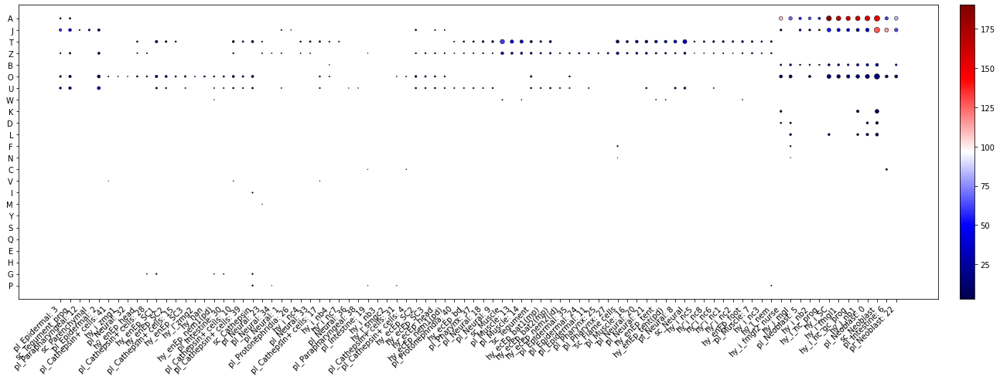

In [52]:
FE.plot_enrichment()

I've provided the hardcoded KOG table in `samap.analysis` to help interpret the axes:

In [53]:
from samap.analysis import _KOG_TABLE

In [54]:
_KOG_TABLE

{'A': 'RNA processing and modification',
 'B': 'Chromatin structure and dynamics',
 'C': 'Energy production and conversion',
 'D': 'Cell cycle control, cell division, chromosome partitioning',
 'E': 'Amino acid transport and metabolism',
 'F': 'Nucleotide transport and metabolism',
 'G': 'Carbohydrate transport and metabolism',
 'H': 'Coenzyme transport and metabolism',
 'I': 'Lipid transport and metabolism',
 'J': 'Translation, ribosomal structure and biogenesis',
 'K': 'Transcription',
 'L': 'Replication, recombination, and repair',
 'M': 'Cell wall membrane/envelope biogenesis',
 'N': 'Cell motility',
 'O': 'Post-translational modification, protein turnover, chaperones',
 'P': 'Inorganic ion transport and metabolism',
 'Q': 'Secondary metabolites biosynthesis, transport and catabolism',
 'R': 'General function prediction only',
 'S': 'Function unknown',
 'T': 'Signal transduction mechanisms',
 'U': 'Intracellular trafficking, secretion, and vesicular transport',
 'V': 'Defense mecha